# **Dog Breeds Classification Using Transfer Learning** <br>

<a id='Data_loading_structure'></a>
## **1. Data Loading and Structure** ##


In [62]:
# Display the Folders/Classes
import numpy as np
import pandas as pd 
import os

print(os.listdir('Images/'))
dog_classes = os.listdir('Images/')

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

In [63]:
# Get the dog labels

breeds = [breed.split('-',1)[1] for breed in dog_classes] # get labels by splitting the folder name at dash
breeds[:10] # view some of the labels

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound']

In [64]:
# Get images full path and their labels

from itertools import chain

X = []
y = []

fullpaths = ['Images/{}'.format(dog_class) for dog_class in dog_classes]

for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append([fullpath + '/' + imgname])
        y.append(breeds[counter])

X = list(chain.from_iterable(X)) # unnest the lists and join together into one list

len(X) # number of pictures

20580

<a id='Shuffle_plot'></a>
## **2. Shuffle and Plot Images** ##

In [4]:
# Random shuffle the images for learning

import random

# shuffle X and y
combined = list(zip(X, y))
random.shuffle(combined)

X[:], y[:] = zip(*combined)

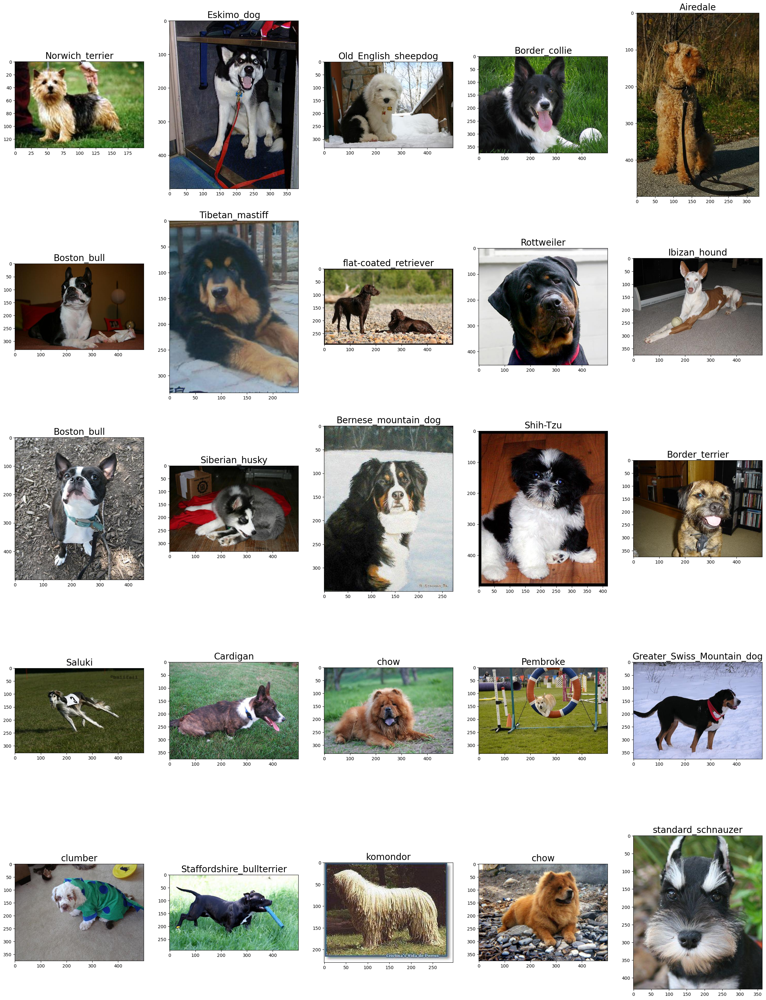

In [5]:
# Display random dogs pictures 

import matplotlib.pyplot as plt
%matplotlib inline 
from matplotlib.image import imread

plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(X)), 25)): # random 25 images
    plt.subplot(5, 5, counter+1)
    plt.subplots_adjust(hspace=0.1)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=20)

    
plt.show()

<a id='Subset_data'></a>
## **3. Subset Data** ##

In [6]:
# Choose a subset to test code

X = X[:8000]
y = y[:8000]

<a id='Encoding_data'></a>
## **4. Encoding Data** ##


In [7]:
# Convert labels to one-hot encoded labels

from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Label and one-hot encoding y labels
le = LabelEncoder()
le.fit(y)
y_ohe = to_categorical(le.transform(y), len(breeds))
y_ohe = np.array(y_ohe)

<a id='Preparing_data'></a>
## **5. Preparing Train, Validation & Test Data** ##

In [8]:
# Prepare train, validation and test data
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img

img_data = np.array([img_to_array(load_img(img, target_size = (299,299)))
                     for img in X]) # load, resize images, and store as array

x_train, x_test, y_train, y_test = train_test_split(img_data, y_ohe,
                                                   test_size = 0.2,
                                                   stratify=np.array(y), # stratify makes sure that proportion of each class in the output is same as the input
                                                   random_state = 2) 

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                 test_size = 0.2,
                                                 stratify=np.array(y_train),
                                                 random_state = 2)

print('Training Dataset Size: ', x_train.shape)
print('Validation Dataset Size: ', x_val.shape)
print('Testing Dataset Size: ', x_test.shape)
print('Training Label Size: ', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)


Training Dataset Size:  (5120, 299, 299, 3)
Validation Dataset Size:  (1280, 299, 299, 3)
Testing Dataset Size:  (1600, 299, 299, 3)
Training Label Size:  (5120, 120)
Validation Label Size:  (1280, 120)
Testing Label Size:  (1600, 120)


<a id='Data_augmentation'></a>
## **6. Data Augmentation** ##

In [55]:
# Data Augmentation

from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 32

# Create train generator
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, # only use rescale=1./255 if training from scratch
                                  rotation_range = 30,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  horizontal_flip = True) # CHECK

train_generator = train_datagen.flow(x_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input) # do not augment validation data

val_generator = val_datagen.flow(x_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)


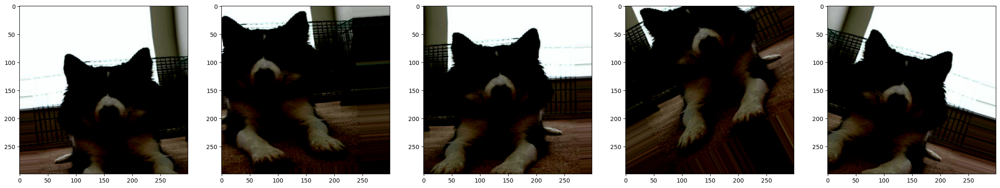

In [56]:
img_id = 20

dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                     shuffle = False, batch_size = batch_size, seed = 1)

plt.figure(figsize=(30,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs): 
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    #plt.axis('off')
    
plt.show()

<a id='Model_building'></a>
## **7. Model Building** ##

In [12]:
# Build Model Using Pre-trained Model

from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

# load InceptionV3 pre-trained model
base_model = InceptionV3(weights = 'imagenet', include_top = False, input_shape = (299,299,3))

model = models.Sequential()
model.add(base_model) # add pre_trained layers
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(len(breeds), activation = 'softmax'))


# Freeze pre-trained layers
print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
model.layers[0].trainable = False
print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

Number of trainable weights before freezing the base layer: 194
Number of trainable weights after freezing the base layer: 6


In [13]:
# Compile the Model

model.compile(Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy']) 
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 8, 8, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 120)            │        61,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,176,088 (88.41 MB)

 Trainable params: 1,373,304 (5.24 MB)

 Non-trainable params: 21,802,784 (83.17 MB)


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


<a id='Train_model'></a>
## **8. Train Model** ##

In [21]:
# Train Model

train_steps_per_epoch = x_train.shape[0] // batch_size
val_steps_per_epoch = x_val.shape[0] // batch_size
epochs = 20

history = model.fit(train_generator,
                             steps_per_epoch = train_steps_per_epoch,
                             validation_data = val_generator,
                             validation_steps = val_steps_per_epoch,
                             epochs = epochs, verbose = 1)

model.save('dog_breed_classifier_model_via_inceptionv3.h5')

c:\Users\tiyob\Desktop\YaYa_Wallet\virt\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 309s 2s/step - accuracy: 0.0900 - loss: 4.5433 - val_accuracy: 0.6961 - val_loss: 2.6247
Epoch 2/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 296s 2s/step - accuracy: 0.6478 - loss: 2.2001 - val_accuracy: 0.8398 - val_loss: 0.7909
Epoch 3/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 290s 2s/step - accuracy: 0.7744 - loss: 0.9766 - val_accuracy: 0.8656 - val_loss: 0.5145
Epoch 4/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 289s 2s/step - accuracy: 0.8206 - loss: 0.6834 - val_accuracy: 0.8773 - val_loss: 0.4367
Epoch 5/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 290s 2s/step - accuracy: 0.8285 - loss: 0.6105 - val_accuracy: 0.8781 - val_loss: 0.4149
Epoch 6/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 290s 2s/step - accuracy: 0.8437 - loss: 0.5549 - val_accuracy: 0.8820 - val_loss: 0.3802
Epoch 7/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 316s 2s/step - accuracy: 0.8515 - loss: 0.4952 - val_accuracy: 0.8859 - val_loss: 0.3722
Epoch 8/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 393s 2s/step - accuracy: 0.8448 - loss: 0.4821 - val_accu

<a id='Accuracy_loss_plots'></a>
## **9. Accuracy and Loss Plots** ##

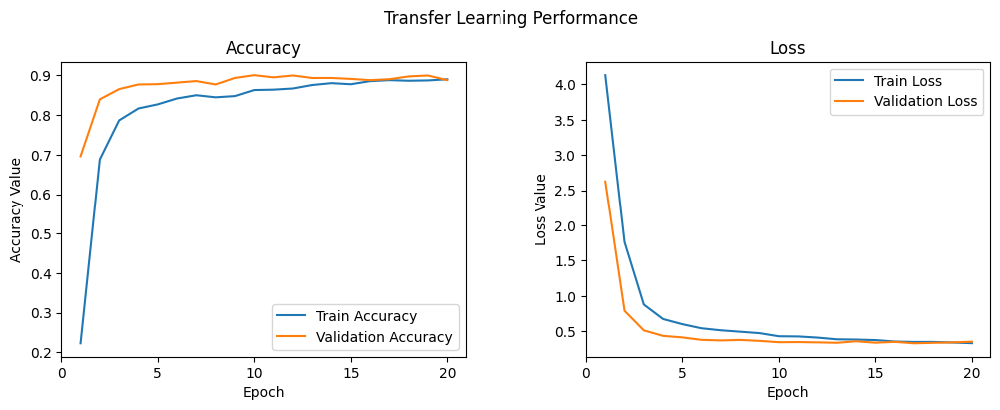

In [22]:
# Plot Accuracy and Loss 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Transfer Learning Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

<a id='Predict_test'></a>
## **10. Predicting on Test Set** ##

In [23]:
# Evaluate Model on Test Data

x_test1 = x_test / 255. # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = model.predict(x_test1)

# get model predictions
predictions = le.classes_[np.argmax(test_predictions,axis=1)] # get labels and reverse back to get the text labels
# get target labels
target_labels = le.classes_[np.argmax(y_test,axis=1)]

# Store in dataframe
predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)


50/50 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step


,Target_Labels,Predictions
0,otterhound,otterhound
1,Chihuahua,Chihuahua
2,Sealyham_terrier,Sealyham_terrier
3,Leonberg,Leonberg
4,basset,basset
5,collie,Border_collie
6,American_Staffordshire_terrier,American_Staffordshire_terrier
7,Pomeranian,Pomeranian
8,Rhodesian_ridgeback,vizsla
9,Irish_wolfhound,Irish_wolfhound


<a id='Evaluation_metrics'></a>
## **11. Model Evaluation Metrics** ##

In [24]:
# Get accuracy of measure

correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
print(accuracy)

0.88125


In [47]:
from sklearn import metrics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.base import clone
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc 


def get_metrics(true_labels, predicted_labels):
    
    print('Accuracy:', np.round(
                        metrics.accuracy_score(true_labels, 
                                               predicted_labels),
                        4))
    print('Precision:', np.round(
                        metrics.precision_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('Recall:', np.round(
                        metrics.recall_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('F1 Score:', np.round(
                        metrics.f1_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
                        

def train_predict_model(classifier, 
                        train_features, train_labels, 
                        test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    return predictions    


def display_confusion_matrix(true_labels, predicted_labels, classes=[1,0]):
    
    total_classes = len(classes)
    level_labels = [total_classes*[0], list(range(total_classes))]

    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels, 
                                  labels=classes)
    cm_frame = pd.DataFrame(data=cm, 
                            columns=pd.MultiIndex(levels=[['Predicted:'], classes], 
                                                  codes=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], classes], 
                                                codes=level_labels)) 
    return cm_frame
    
def display_classification_report(true_labels, predicted_labels, classes=[1,0]):

    report = metrics.classification_report(y_true=true_labels, 
                                           y_pred=predicted_labels, 
                                           labels=classes) 
    print(report)
    
    
    
def display_model_performance_metrics(true_labels, predicted_labels, classes=[1,0]):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, 
                                  classes=classes)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, 
                             classes=classes)



In [34]:
# Evaluate Model Performance
get_metrics(true_labels=target_labels,
            predicted_labels=predictions)

Accuracy: 0.8812
Precision: 0.8971
Recall: 0.8812
F1 Score: 0.8771


In [37]:
display_confusion_matrix(true_labels=target_labels, predicted_labels=predictions,  classes=breeds)

Predicted:                                        \
                             Chihuahua Japanese_spaniel Maltese_dog Pekinese   
Actual: Chihuahua                   12                0           0        0   
        Japanese_spaniel             0               10           0        0   
        Maltese_dog                  0                0          18        0   
        Pekinese                     0                0           0        9   
        Shih-Tzu                     0                0           0        0   
...                                ...              ...         ...      ...   
        standard_poodle              0                0           0        0   
        Mexican_hairless             1                0           0        0   
        dingo                        0                0           0        0   
        dhole                        0                0           0        0   
        African_hunting_dog          0                0           0        0   

                                                                            \
                            Shih-Tzu Blenheim_spaniel papillon toy_terrier   
Actual: Chihuahua                  0                0        0           0   
        Japanese_spaniel           0                0        1           0   
        Maltese_dog                1                0        0           0   
        Pekinese                   2                0        0           0   
        Shih-Tzu                  14                0        0           0   
...                              ...              ...      ...         ...   
        standard_poodle            0                0        0           0   
        Mexican_hairless           0                0        0           0   
        dingo                      0                0        0           0   
        dhole                      0                0        0           0   
        African_hunting_dog        0                0        0           0   

                                                              ...  \
                            Rhodesian_ridgeback Afghan_hound  ...   
Actual: Chihuahua                             0            0  ...   
        Japanese_spaniel                      0            0  ...   
        Maltese_dog                           0            0  ...   
        Pekinese                              0            0  ...   
        Shih-Tzu                              0            0  ...   
...                                         ...          ...  ...   
        standard_poodle                       0            0  ...   
        Mexican_hairless                      0            0  ...   
        dingo                                 0            0  ...   
        dhole                                 0            0  ...   
        African_hunting_dog                   0            0  ...   

                                                                            \
                            Brabancon_griffon Pembroke Cardigan toy_poodle   
Actual: Chihuahua                           0        0        0          0   
        Japanese_spaniel                    0        0        0          0   
        Maltese_dog                         0        0        0          0   
        Pekinese                            0        0        0          0   
        Shih-Tzu                            0        0        0          0   
...                                       ...      ...      ...        ...   
        standard_poodle                     0        0        0          0   
        Mexican_hairless                    0        0        0          0   
        dingo                               0        0        0          0   
        dhole                               0        0        0          0   
        African_hunting_dog                 0        0        0          0   

                                                           

In [45]:
display_classification_report(true_labels=target_labels, predicted_labels=predictions, classes=breeds)

                                precision    recall  f1-score   support

                     Chihuahua       0.80      0.92      0.86        13
              Japanese_spaniel       1.00      0.91      0.95        11
                   Maltese_dog       0.95      0.95      0.95        19
                      Pekinese       1.00      0.82      0.90        11
                      Shih-Tzu       0.67      0.82      0.74        17
              Blenheim_spaniel       1.00      1.00      1.00        16
                      papillon       0.93      1.00      0.96        13
                   toy_terrier       0.77      0.77      0.77        13
           Rhodesian_ridgeback       1.00      0.36      0.53        14
                  Afghan_hound       0.87      1.00      0.93        20
                        basset       1.00      0.87      0.93        15
                        beagle       0.85      1.00      0.92        17
                    bloodhound       1.00      0.67      0.80  

In [46]:
display_model_performance_metrics(true_labels=target_labels, predicted_labels=predictions, classes=breeds)

Model Performance metrics:
------------------------------
Accuracy: 0.8812
Precision: 0.8971
Recall: 0.8812
F1 Score: 0.8771

Model Classification report:
------------------------------
                                precision    recall  f1-score   support

                     Chihuahua       0.80      0.92      0.86        13
              Japanese_spaniel       1.00      0.91      0.95        11
                   Maltese_dog       0.95      0.95      0.95        19
                      Pekinese       1.00      0.82      0.90        11
                      Shih-Tzu       0.67      0.82      0.74        17
              Blenheim_spaniel       1.00      1.00      1.00        16
                      papillon       0.93      1.00      0.96        13
                   toy_terrier       0.77      0.77      0.77        13
           Rhodesian_ridgeback       1.00      0.36      0.53        14
                  Afghan_hound       0.87      1.00      0.93        20
                     

<a id='Plot_predictions'></a>
## **12. Plot Predictions against Actual Labels** ##

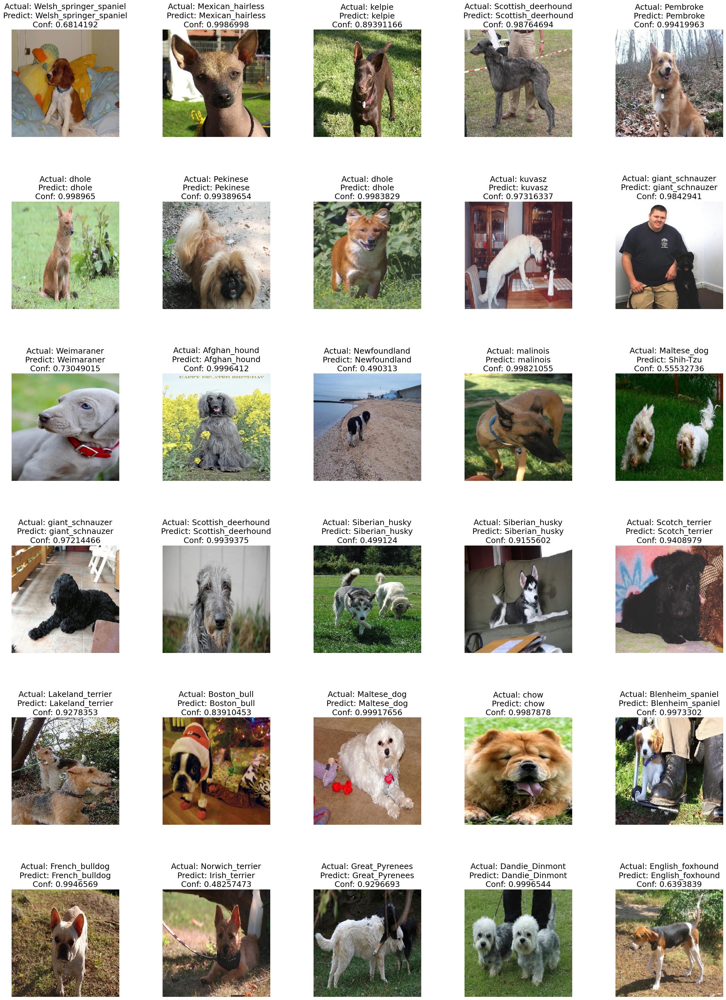

In [48]:
# Plot Actual vs Predicted Images with Confidence Levels
    
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)
    
plt.show()